# E — Error Analysis, Grad-CAM and Final Model Comparison

**Member E contribution: model error analysis, Grad-CAM interpretation and final model comparison**

This notebook presents Member E's error analysis, Grad-CAM interpretation and final model comparison. The complete implementations are stored in `src/error_analysis.py`, `src/gradcam_analysis.py` and `src/build_final_comparison_table.py`. Rather than repeating the full code, this notebook runs the existing pipelines and focuses on the key tables, prediction examples, visualisations and comparison results.

This notebook presents:

1. Successful and failure prediction cases for all three models
2. Most frequently confused species pairs and selected confusion matrices
3. Grad-CAM visualisations for the pretrained model
4. Final comparison of clean performance, robustness and runtime

## 1. Error Analysis

This section analyses the clean test predictions from the traditional, scratch and pretrained models.

It identifies:

- Top-1 correct predictions
- High-confidence correct predictions
- Difficult but correct predictions
- Top-1 wrong predictions
- Top-1 wrong but Top-5 correct predictions
- High-confidence wrong predictions
- Frequently confused species pairs
- Selected confusion matrices

### 1.1 Environment and Configuration

In [2]:
from pathlib import Path
import subprocess
import sys

import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
from IPython.display import display

# Automatically locate the project root whether the notebook is opened
# from the repository root or from the notebooks folder.
PROJECT_ROOT = Path.cwd()

if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

if not (PROJECT_ROOT / "src").exists():
    raise FileNotFoundError(
        "Cannot locate the project root. Please open this notebook "
        "from the repository root or the notebooks folder."
    )

ERROR_ANALYSIS_DIR = (
    PROJECT_ROOT
    / "results"
    / "error_analysis"
)

ERROR_FIGURE_DIR = (
    PROJECT_ROOT
    / "results"
    / "figures"
    / "error_analysis"
)

print(f"Project root: {PROJECT_ROOT}")
print(f"Python executable: {sys.executable}")
print(f"Error Analysis results: {ERROR_ANALYSIS_DIR}")
print(f"Error Analysis figures: {ERROR_FIGURE_DIR}")

Project root: /Users/yangjingwei/9517_Project/COMP9517-project
Python executable: /opt/anaconda3/envs/comp9517/bin/python
Error Analysis results: /Users/yangjingwei/9517_Project/COMP9517-project/results/error_analysis
Error Analysis figures: /Users/yangjingwei/9517_Project/COMP9517-project/results/figures/error_analysis


### 1.2 Run the Error Analysis Pipeline

The complete implementation is stored in `src/error_analysis.py`. This cell runs the pipeline and regenerates all Error Analysis CSV files and figures from the clean prediction files of the three models.

In [4]:
error_analysis_script = (
    PROJECT_ROOT
    / "src"
    / "error_analysis.py"
)

result = subprocess.run(
    [
        sys.executable,
        str(error_analysis_script),
    ],
    cwd=PROJECT_ROOT,
    check=True,
)


Analysing model: traditional
Prediction file: /Users/yangjingwei/9517_Project/COMP9517-project/results/clean/traditional_predictions.csv

[traditional] Case analysis
              case_type  count
           top1_correct    537
             top1_wrong   4463
top1_wrong_top5_correct    615
  difficult_but_correct    537
high_confidence_correct      0
  high_confidence_wrong      0

Analysing model: scratch
Prediction file: /Users/yangjingwei/9517_Project/COMP9517-project/results/clean/scratch_predictions.csv

[scratch] Case analysis
              case_type  count
           top1_correct   1605
             top1_wrong   3395
top1_wrong_top5_correct   1278
  difficult_but_correct    798
high_confidence_correct    358
  high_confidence_wrong     31

Analysing model: pretrained
Prediction file: /Users/yangjingwei/9517_Project/COMP9517-project/results/clean/pretrained_predictions.csv

[pretrained] Case analysis
              case_type  count
           top1_correct   3412
             top1_

### 1.3 Overall Clean Test Performance

This section compares the three models on the clean test set using Top-1 accuracy, Top-5 accuracy and confidence-related summary statistics.

,model,total_samples,top1_accuracy,top5_accuracy,mean_confidence,mean_correct_confidence,mean_wrong_confidence,high_confidence_wrong
0,traditional,5000,0.1074,0.2304,0.0299,0.0525,0.0272,0
1,scratch,5000,0.3210,0.5766,0.3266,0.5256,0.2326,31
2,pretrained,5000,0.6824,0.8698,0.6050,0.7314,0.3334,54


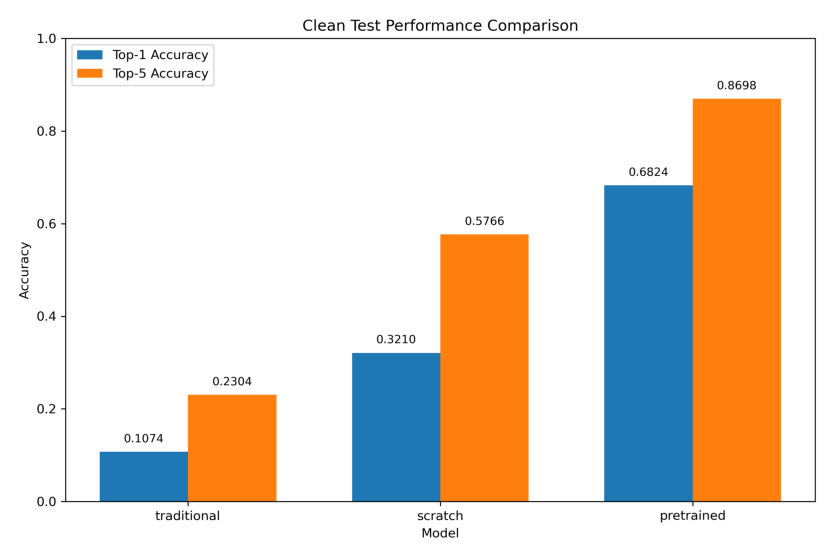

In [5]:
model_summary_path = (
    ERROR_ANALYSIS_DIR
    / "model_comparison_summary.csv"
)

model_comparison_figure_path = (
    ERROR_FIGURE_DIR
    / "model_accuracy_comparison.png"
)

model_summary = pd.read_csv(
    model_summary_path
)

# Display the main comparison statistics in a readable format.
summary_columns = [
    "model",
    "total_samples",
    "top1_accuracy",
    "top5_accuracy",
    "mean_confidence",
    "mean_correct_confidence",
    "mean_wrong_confidence",
    "high_confidence_wrong",
]

display(
    model_summary[summary_columns].style.format(
        {
            "top1_accuracy": "{:.4f}",
            "top5_accuracy": "{:.4f}",
            "mean_confidence": "{:.4f}",
            "mean_correct_confidence": "{:.4f}",
            "mean_wrong_confidence": "{:.4f}",
        }
    )
)

# Display the clean Top-1 and Top-5 accuracy comparison figure.
comparison_image = Image.open(
    model_comparison_figure_path
)

plt.figure(figsize=(12, 7))
plt.imshow(comparison_image)
plt.axis("off")
plt.show()

### 1.4 Case Count Summary

This section combines the numbers of successful and failure prediction cases identified for the traditional, scratch and pretrained models.

In [7]:
case_summary_tables = []

for model_name in ["traditional", "scratch", "pretrained"]:
    case_summary_path = (
        ERROR_ANALYSIS_DIR
        / model_name
        / "case_summary.csv"
    )

    model_case_summary = pd.read_csv(
        case_summary_path
    )

    model_case_summary.insert(
        0,
        "model",
        model_name,
    )

    case_summary_tables.append(
        model_case_summary
    )

combined_case_summary = pd.concat(
    case_summary_tables,
    ignore_index=True,
)

case_count_table = combined_case_summary.pivot(
    index="model",
    columns="case_type",
    values="count",
).reset_index()

# Arrange the columns in the same logical order used by the analysis pipeline.
case_count_table = case_count_table[
    [
        "model",
        "top1_correct",
        "high_confidence_correct",
        "difficult_but_correct",
        "top1_wrong",
        "top1_wrong_top5_correct",
        "high_confidence_wrong",
    ]
]

display_case_count_table = case_count_table.rename(
    columns={
        "model": "Model",
        "top1_correct": "Top-1 Correct",
        "high_confidence_correct": "High-Conf. Correct",
        "difficult_but_correct": "Difficult Correct",
        "top1_wrong": "Top-1 Wrong",
        "top1_wrong_top5_correct": "Top-1 Wrong\nTop-5 Correct",
        "high_confidence_wrong": "High-Conf. Wrong",
    }
)

model_order = [
    "traditional",
    "scratch",
    "pretrained",
]

case_count_table["model"] = pd.Categorical(
    case_count_table["model"],
    categories=model_order,
    ordered=True,
)

case_count_table = (
    case_count_table
    .sort_values("model")
    .reset_index(drop=True)
)

display(
    display_case_count_table.style
    .hide(axis="index")
    .set_properties(**{"text-align": "center"})
    .set_table_styles(
        [
            {
                "selector": "th",
                "props": [
                    ("text-align", "center"),
                    ("white-space", "pre-line"),
                ],
            }
        ]
    )
)

Model,Top-1 Correct,High-Conf. Correct,Difficult Correct,Top-1 Wrong,Top-1 Wrong Top-5 Correct,High-Conf. Wrong
pretrained,3412,1761,725,1588,937,54
scratch,1605,358,798,3395,1278,31
traditional,537,0,537,4463,615,0


### 1.5 Successful Prediction Examples

This section displays representative successful predictions for the traditional, scratch and pretrained models.

Each gallery includes available examples from:

- Top-1 correct predictions
- High-confidence correct predictions
- Difficult but correct predictions

Traditional — Successful Prediction Examples


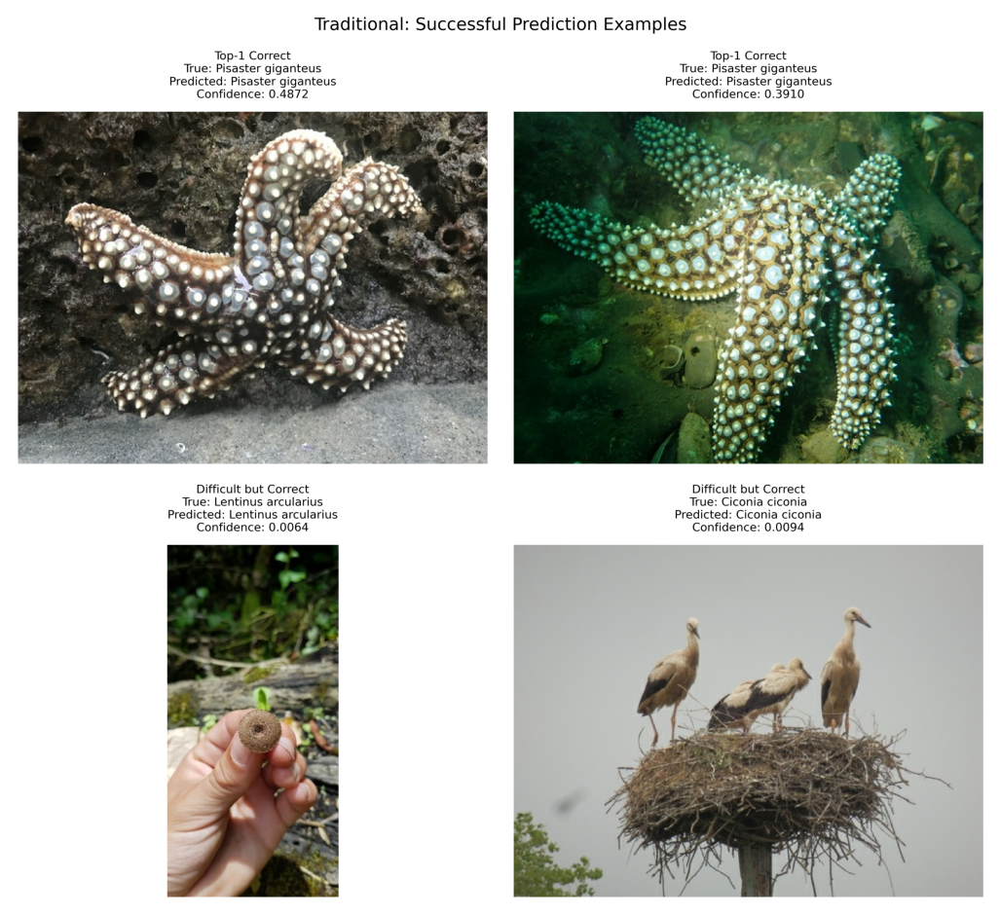

Scratch ResNet18 — Successful Prediction Examples


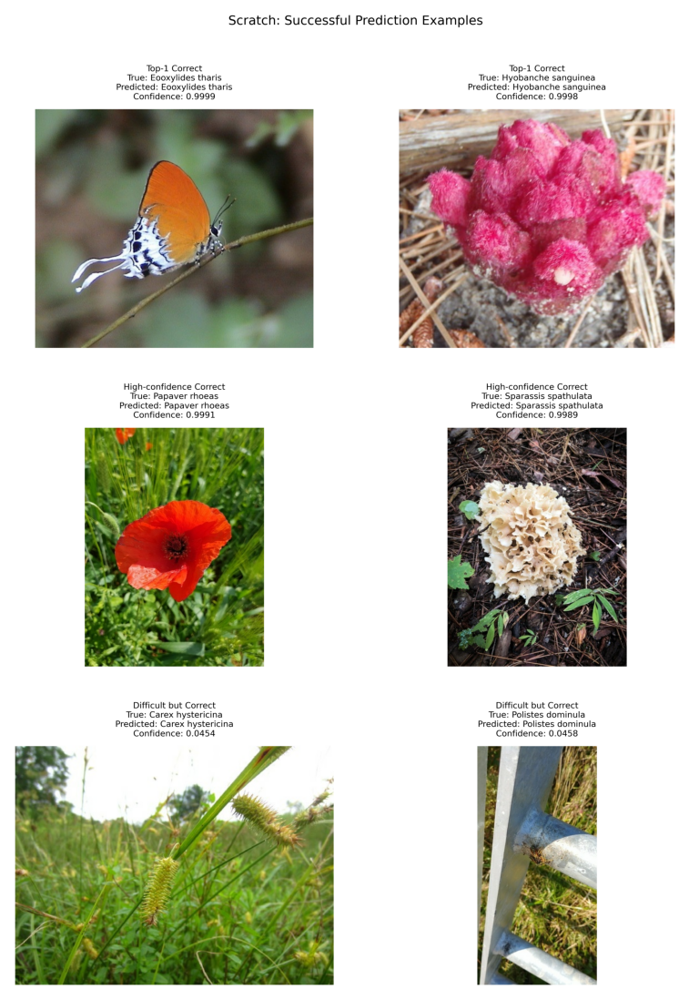

Pretrained ResNet18 — Successful Prediction Examples


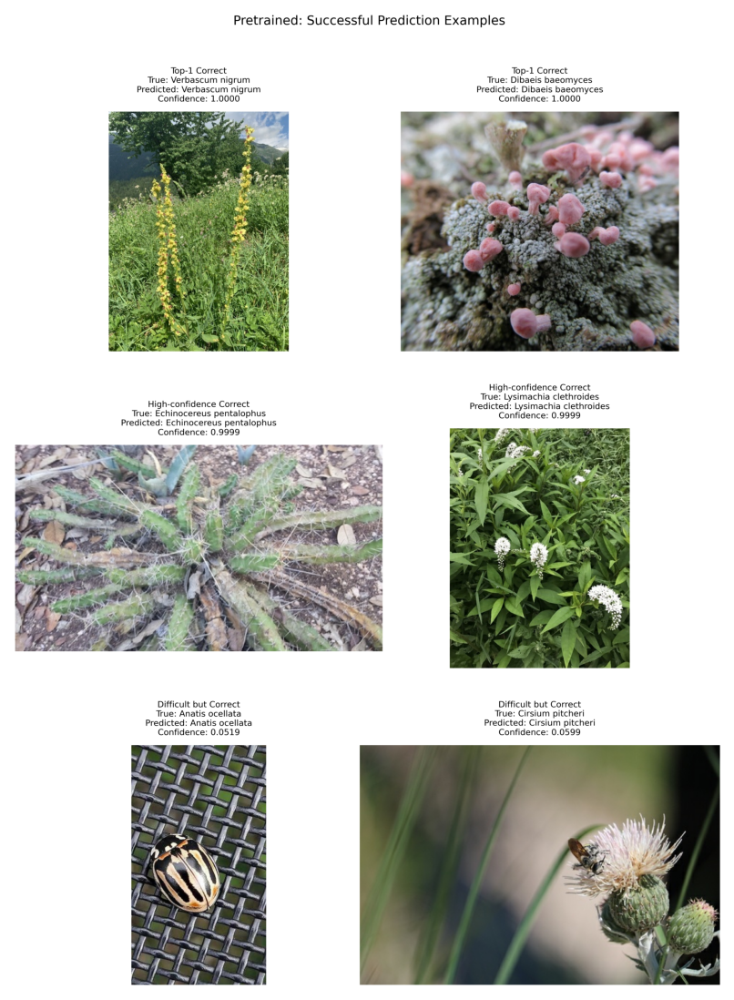

In [8]:
successful_gallery_paths = {
    "Traditional": (
        ERROR_FIGURE_DIR
        / "traditional"
        / "successful_examples_gallery.png"
    ),
    "Scratch ResNet18": (
        ERROR_FIGURE_DIR
        / "scratch"
        / "successful_examples_gallery.png"
    ),
    "Pretrained ResNet18": (
        ERROR_FIGURE_DIR
        / "pretrained"
        / "successful_examples_gallery.png"
    ),
}

for model_name, image_path in successful_gallery_paths.items():
    if not image_path.exists():
        raise FileNotFoundError(
            f"Successful gallery not found: {image_path}"
        )

    print(f"{model_name} — Successful Prediction Examples")

    gallery_image = Image.open(image_path)

    plt.figure(figsize=(13, 14))
    plt.imshow(gallery_image)
    plt.axis("off")
    plt.show()

### 1.6 Failure Prediction Examples

This section displays representative failure predictions for the traditional, scratch and pretrained models.

Each gallery includes available examples from:

- Top-1 wrong predictions
- Top-1 wrong but Top-5 correct predictions
- High-confidence wrong predictions

Traditional — Failure Prediction Examples


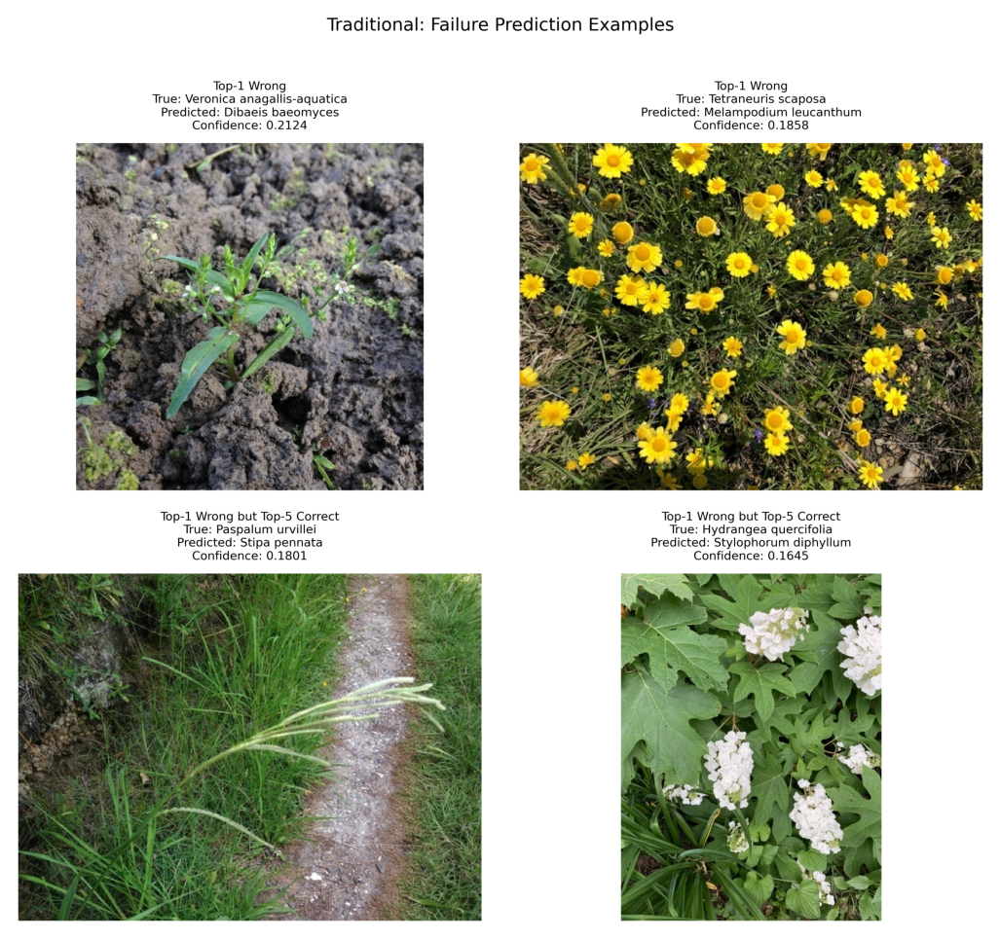

Scratch ResNet18 — Failure Prediction Examples


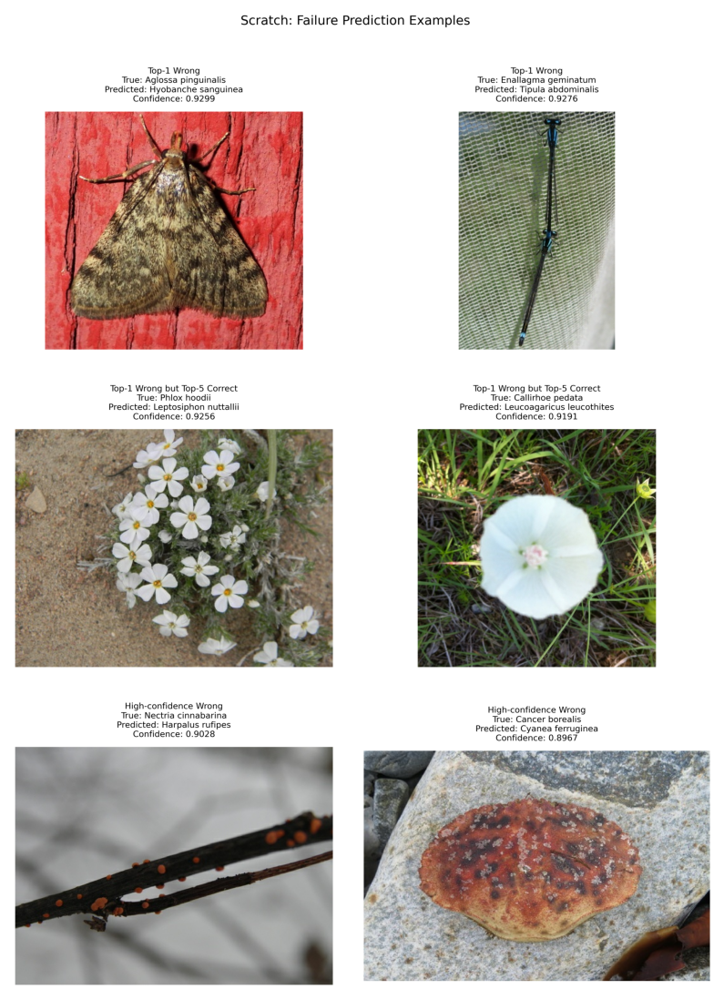

Pretrained ResNet18 — Failure Prediction Examples


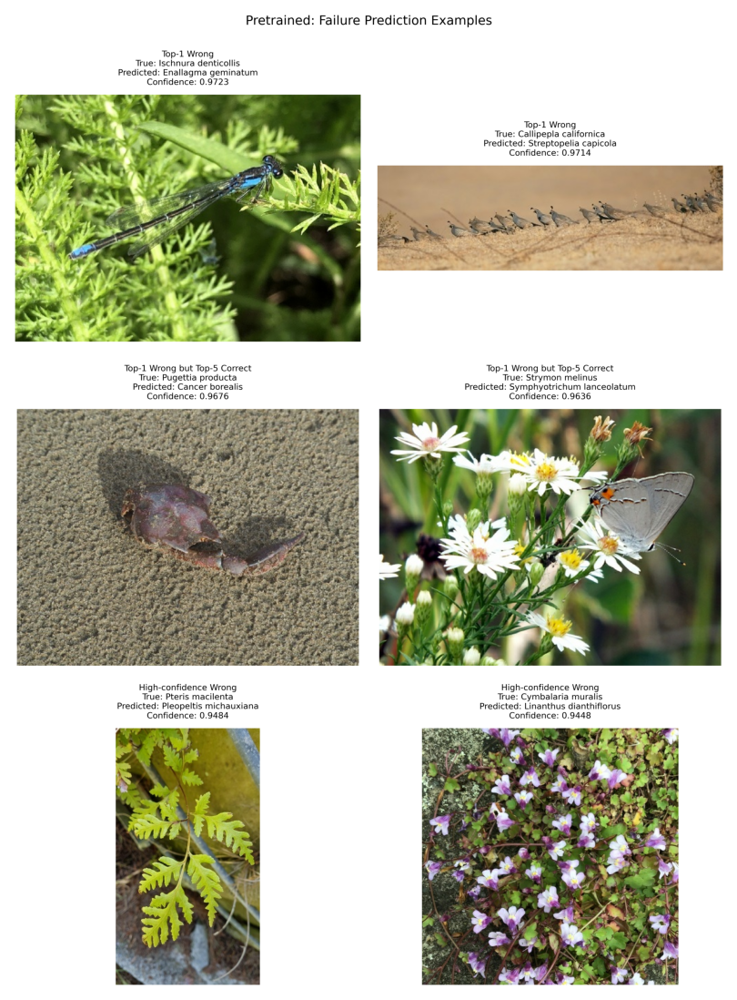

In [9]:
failure_gallery_paths = {
    "Traditional": (
        ERROR_FIGURE_DIR
        / "traditional"
        / "failure_examples_gallery.png"
    ),
    "Scratch ResNet18": (
        ERROR_FIGURE_DIR
        / "scratch"
        / "failure_examples_gallery.png"
    ),
    "Pretrained ResNet18": (
        ERROR_FIGURE_DIR
        / "pretrained"
        / "failure_examples_gallery.png"
    ),
}

for model_name, image_path in failure_gallery_paths.items():
    if not image_path.exists():
        raise FileNotFoundError(
            f"Failure gallery not found: {image_path}"
        )

    print(f"{model_name} — Failure Prediction Examples")

    gallery_image = Image.open(image_path)

    plt.figure(figsize=(13, 14))
    plt.imshow(gallery_image)
    plt.axis("off")
    plt.show()

### 1.7 Confidence Distributions

This section compares the Top-1 confidence distributions of correct and incorrect predictions for the traditional, scratch and pretrained models.

Traditional — Confidence Distribution


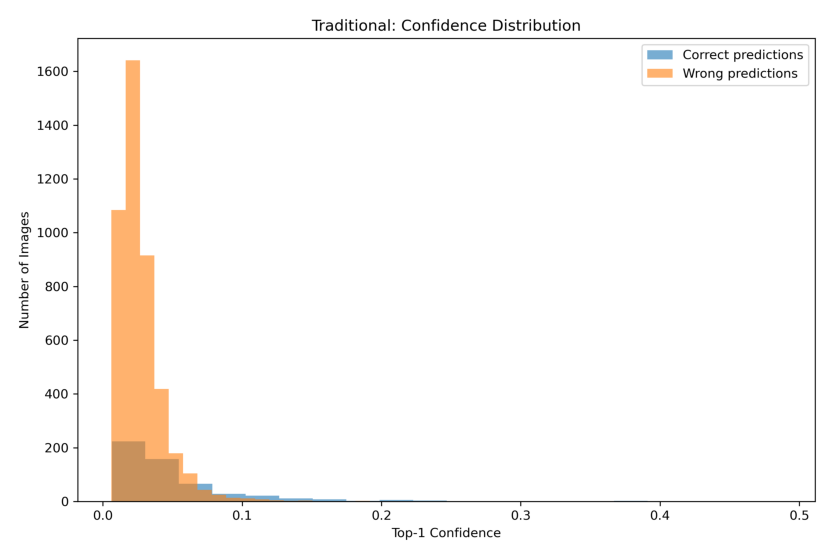

Scratch ResNet18 — Confidence Distribution


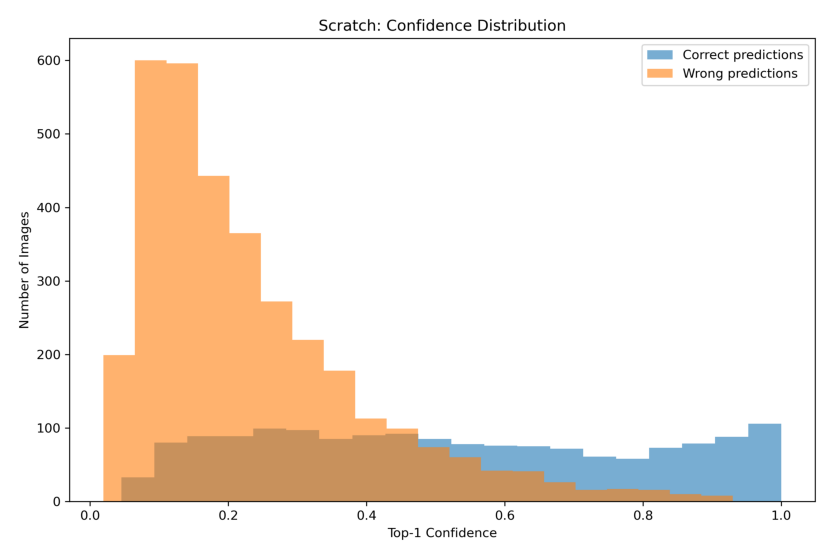

Pretrained ResNet18 — Confidence Distribution


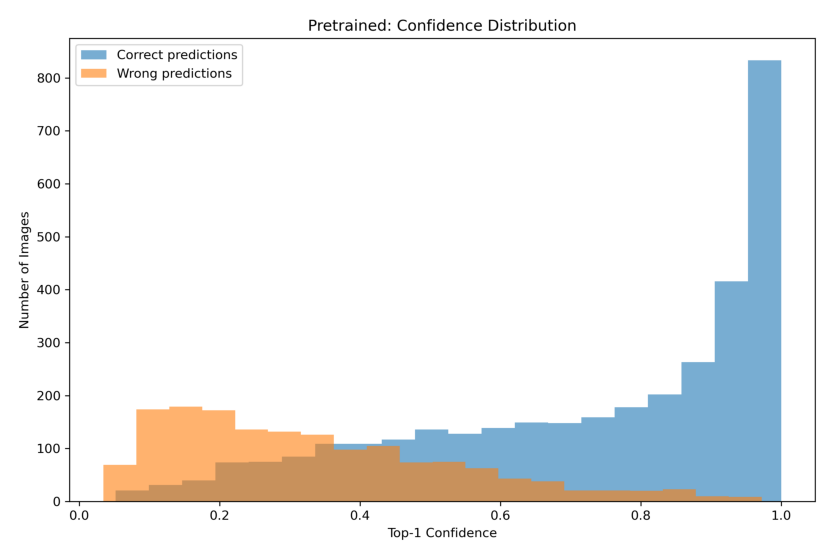

In [10]:
confidence_figure_paths = {
    "Traditional": (
        ERROR_FIGURE_DIR
        / "traditional"
        / "confidence_distribution.png"
    ),
    "Scratch ResNet18": (
        ERROR_FIGURE_DIR
        / "scratch"
        / "confidence_distribution.png"
    ),
    "Pretrained ResNet18": (
        ERROR_FIGURE_DIR
        / "pretrained"
        / "confidence_distribution.png"
    ),
}

for model_name, image_path in confidence_figure_paths.items():
    if not image_path.exists():
        raise FileNotFoundError(
            f"Confidence distribution figure not found: {image_path}"
        )

    print(f"{model_name} — Confidence Distribution")

    confidence_image = Image.open(image_path)

    plt.figure(figsize=(11, 7))
    plt.imshow(confidence_image)
    plt.axis("off")
    plt.show()

### 1.8 Most Frequently Confused Species Pairs

This section shows the most frequent true-class to predicted-class errors for the traditional, scratch and pretrained models.

The corresponding tables report the true species, predicted species, number of errors and the error rate within each true class.

Traditional — Most Frequently Confused Species Pairs


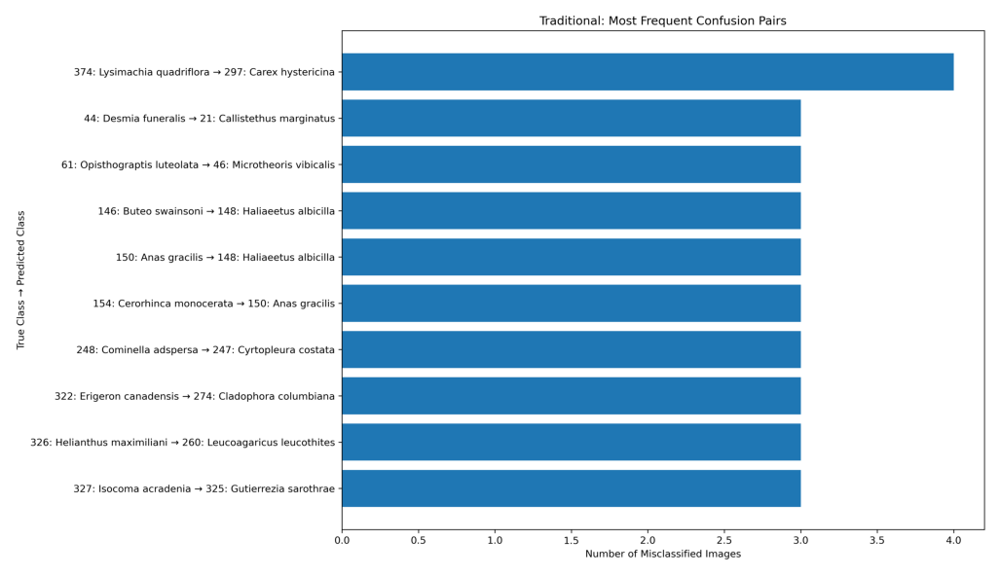

Scratch ResNet18 — Most Frequently Confused Species Pairs


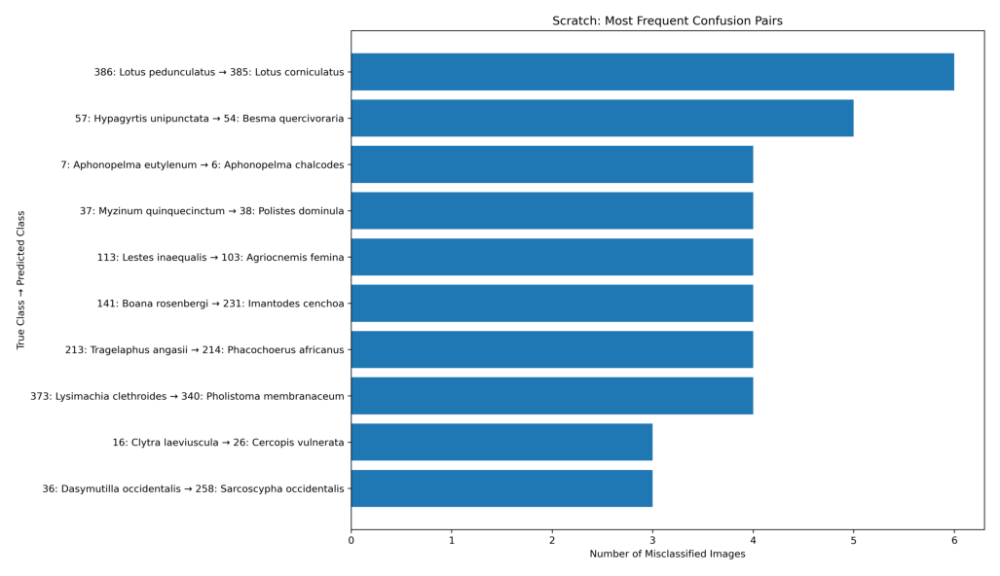

Pretrained ResNet18 — Most Frequently Confused Species Pairs


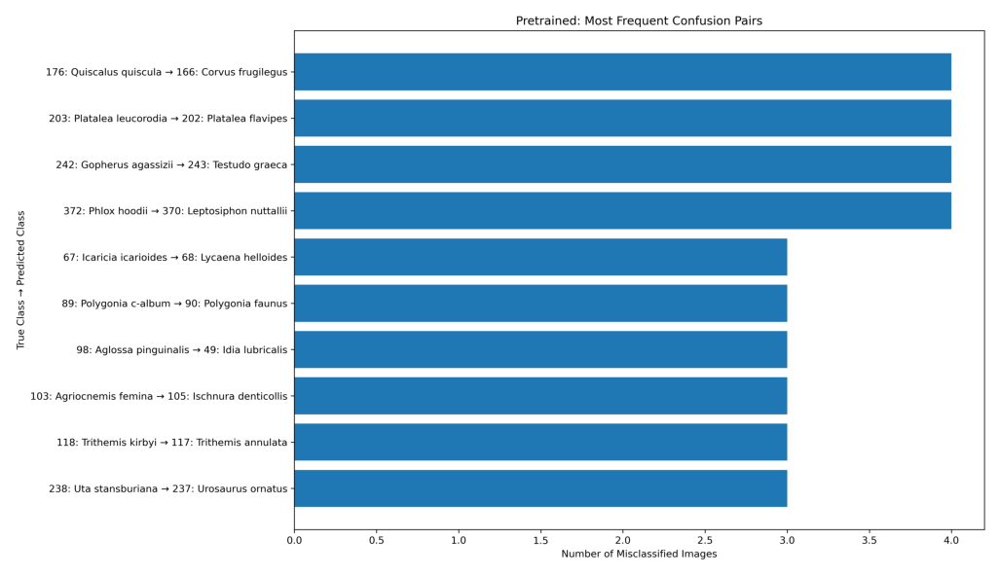

In [11]:
confused_pair_figure_paths = {
    "Traditional": (
        ERROR_FIGURE_DIR
        / "traditional"
        / "most_confused_class_pairs.png"
    ),
    "Scratch ResNet18": (
        ERROR_FIGURE_DIR
        / "scratch"
        / "most_confused_class_pairs.png"
    ),
    "Pretrained ResNet18": (
        ERROR_FIGURE_DIR
        / "pretrained"
        / "most_confused_class_pairs.png"
    ),
}

for model_name, image_path in confused_pair_figure_paths.items():
    if not image_path.exists():
        raise FileNotFoundError(
            f"Confused-pair figure not found: {image_path}"
        )

    print(f"{model_name} — Most Frequently Confused Species Pairs")

    confused_pair_image = Image.open(image_path)

    plt.figure(figsize=(13, 8))
    plt.imshow(confused_pair_image)
    plt.axis("off")
    plt.show()

### 1.9 Selected Confusion Matrices

This section displays normalised confusion matrices for the true classes with the largest numbers of Top-1 errors.

Predictions outside the selected displayed classes are grouped into an `Other` column so that these errors are not discarded.

Traditional — Selected Confusion Matrix


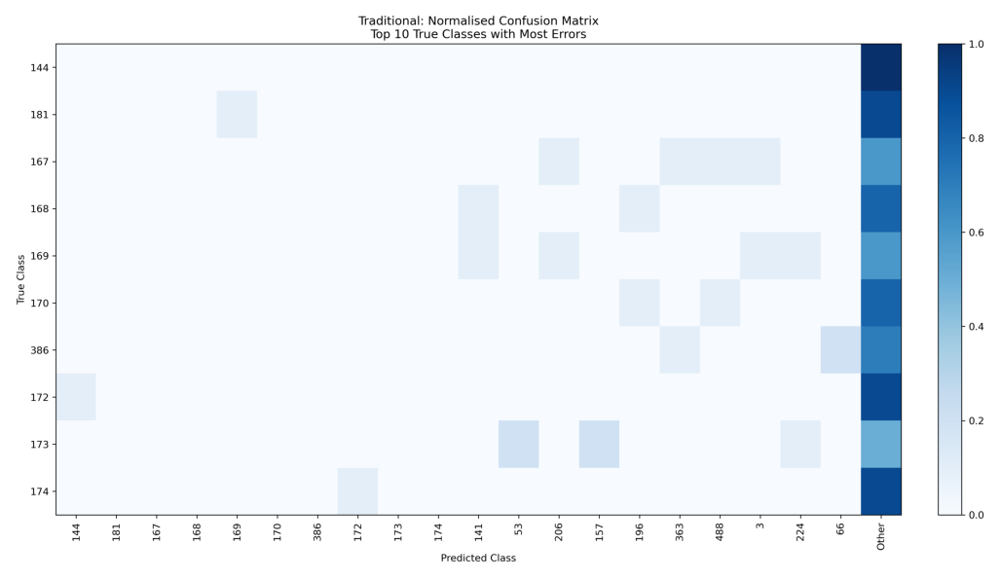

Scratch ResNet18 — Selected Confusion Matrix


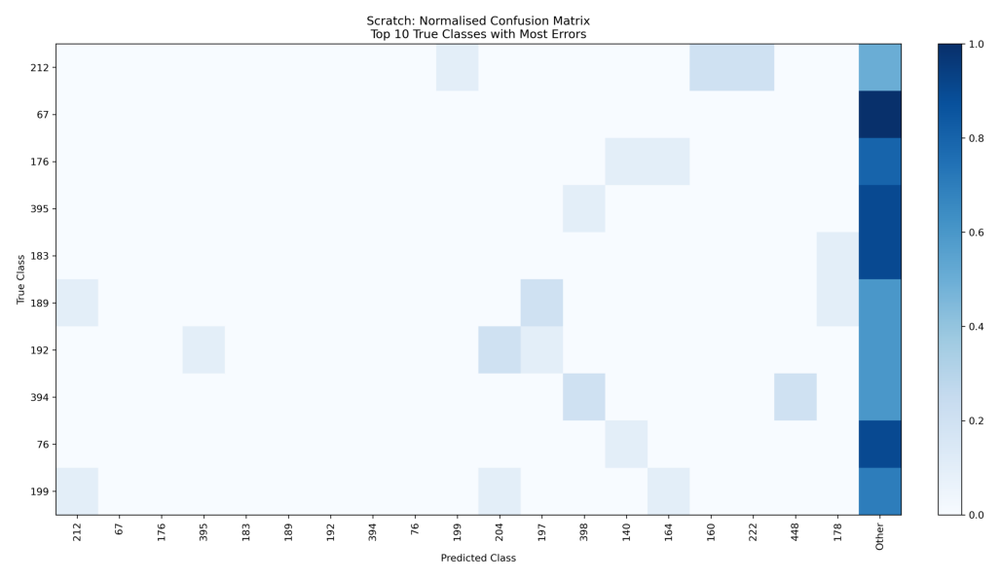

Pretrained ResNet18 — Selected Confusion Matrix


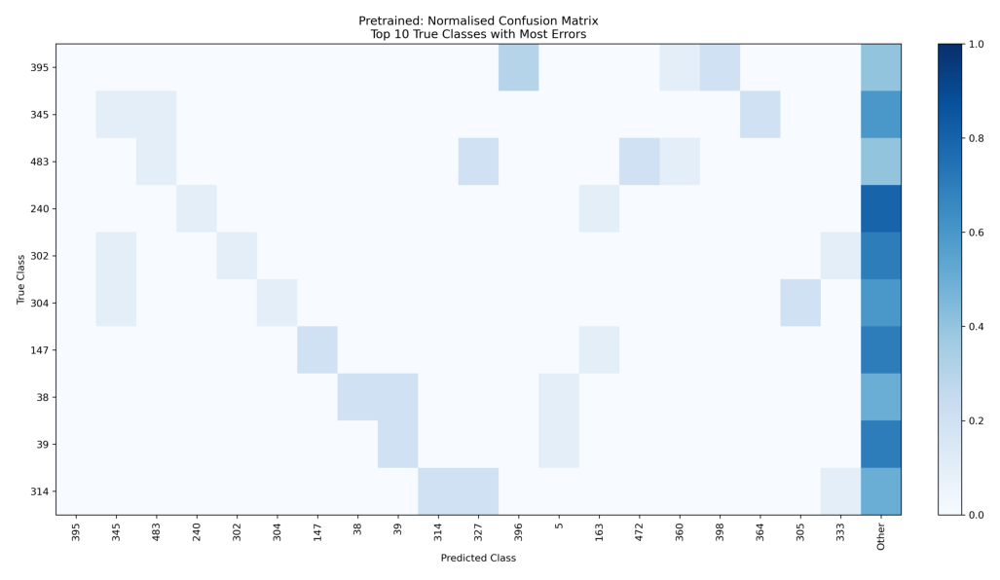

In [12]:
selected_confusion_matrix_paths = {
    "Traditional": (
        ERROR_FIGURE_DIR
        / "traditional"
        / "selected_confusion_matrix.png"
    ),
    "Scratch ResNet18": (
        ERROR_FIGURE_DIR
        / "scratch"
        / "selected_confusion_matrix.png"
    ),
    "Pretrained ResNet18": (
        ERROR_FIGURE_DIR
        / "pretrained"
        / "selected_confusion_matrix.png"
    ),
}

for model_name, image_path in selected_confusion_matrix_paths.items():
    if not image_path.exists():
        raise FileNotFoundError(
            f"Selected confusion matrix not found: {image_path}"
        )

    print(f"{model_name} — Selected Confusion Matrix")

    confusion_matrix_image = Image.open(image_path)

    plt.figure(figsize=(13, 8))
    plt.imshow(confusion_matrix_image)
    plt.axis("off")
    plt.show()

## 2. Grad-CAM

This section applies Grad-CAM to the selected pretrained ResNet18 model and visualises the image regions that contributed most strongly to its predictions.

### 2.1 Environment and Configuration

This cell defines the Grad-CAM output directories and checks the required checkpoint, prediction files and class mapping.

In [13]:
GRADCAM_ANALYSIS_DIR = (
    PROJECT_ROOT
    / "results"
    / "gradcam_pretrained"
)

GRADCAM_FIGURE_DIR = (
    PROJECT_ROOT
    / "results"
    / "figures"
    / "gradcam"
    / "pretrained"
)

GRADCAM_CHECKPOINT = (
    PROJECT_ROOT
    / "results"
    / "models"
    / "pretrained_finetune_best.pth"
)

GRADCAM_INPUT_FILES = {
    "Correct examples": (
        PROJECT_ROOT
        / "results"
        / "clean"
        / "pretrained_correct_examples.csv"
    ),
    "Incorrect examples": (
        PROJECT_ROOT
        / "results"
        / "clean"
        / "pretrained_incorrect_examples.csv"
    ),
    "Confused pairs": (
        PROJECT_ROOT
        / "results"
        / "clean"
        / "pretrained_confused_pairs.csv"
    ),
    "Full predictions": (
        PROJECT_ROOT
        / "results"
        / "clean"
        / "pretrained_predictions.csv"
    ),
    "Class mapping": (
        PROJECT_ROOT
        / "data"
        / "splits"
        / "idx_to_class.json"
    ),
}

print(f"Grad-CAM analysis results: {GRADCAM_ANALYSIS_DIR}")
print(f"Grad-CAM figures: {GRADCAM_FIGURE_DIR}")
print(f"Checkpoint exists: {GRADCAM_CHECKPOINT.exists()}")

for file_name, file_path in GRADCAM_INPUT_FILES.items():
    print(f"{file_name}: {file_path.exists()} — {file_path}")

Grad-CAM analysis results: /Users/yangjingwei/9517_Project/COMP9517-project/results/gradcam_pretrained
Grad-CAM figures: /Users/yangjingwei/9517_Project/COMP9517-project/results/figures/gradcam/pretrained
Checkpoint exists: True
Correct examples: True — /Users/yangjingwei/9517_Project/COMP9517-project/results/clean/pretrained_correct_examples.csv
Incorrect examples: True — /Users/yangjingwei/9517_Project/COMP9517-project/results/clean/pretrained_incorrect_examples.csv
Confused pairs: True — /Users/yangjingwei/9517_Project/COMP9517-project/results/clean/pretrained_confused_pairs.csv
Full predictions: True — /Users/yangjingwei/9517_Project/COMP9517-project/results/clean/pretrained_predictions.csv
Class mapping: True — /Users/yangjingwei/9517_Project/COMP9517-project/data/splits/idx_to_class.json


### 2.2 Run the Grad-CAM Pipeline

This cell runs the complete Grad-CAM analysis script using the pretrained ResNet18 checkpoint and saves the generated summaries and visualisations.

In [14]:
gradcam_script_path = (
    PROJECT_ROOT
    / "src"
    / "gradcam_analysis.py"
)

if not gradcam_script_path.exists():
    raise FileNotFoundError(
        f"Grad-CAM script not found: {gradcam_script_path}"
    )

_ = subprocess.run(
    [
        sys.executable,
        str(gradcam_script_path),
    ],
    cwd=PROJECT_ROOT,
    check=True,
)

Checkpoint: /Users/yangjingwei/9517_Project/COMP9517-project/results/models/pretrained_finetune_best.pth
Checkpoint epoch: 20
Number of classes: 500
Image size: 224
Device: mps
[correct] f8b15262-9ab5-48fd-a2d4-0394074af07c.jpg | true=274 | pred=274 | confidence=0.9401 | CSV match=True
[correct] 58d99ec9-7c8c-452e-a1dc-a8b710821da2.jpg | true=418 | pred=418 | confidence=0.3270 | CSV match=True
[correct] bcaeec6d-8a5a-4985-9ce3-97e9b55e0e24.jpg | true=139 | pred=139 | confidence=0.4370 | CSV match=True
[correct] 6380f426-6f90-4d8d-9d54-15d7faade6fb.jpg | true=293 | pred=293 | confidence=0.9792 | CSV match=True
[correct] 2b1e98fd-1d46-4973-83f9-92c6aee33706.jpg | true=123 | pred=123 | confidence=0.5289 | CSV match=True
[incorrect] b543cc5d-2063-4ebc-bb8d-eee6daa2bca8.jpg | true=393 | pred=191 | confidence=0.1721 | CSV match=True
[incorrect] 968e7ddb-e9ab-4180-9a8c-6d114ca3e299.jpg | true=146 | pred=170 | confidence=0.3048 | CSV match=True
[incorrect] 780f8a37-cb10-4ebf-a7ab-c1b7eda0e7e7.

### 2.3 Grad-CAM Summary

This section summarises all Grad-CAM cases and verifies that the predictions reproduced during Grad-CAM analysis match the saved prediction CSV.

In [15]:
gradcam_summary_path = (
    GRADCAM_ANALYSIS_DIR
    / "gradcam_summary.csv"
)

if not gradcam_summary_path.exists():
    raise FileNotFoundError(
        f"Grad-CAM summary not found: {gradcam_summary_path}"
    )

gradcam_summary = pd.read_csv(
    gradcam_summary_path
)

summary_display = gradcam_summary[
    [
        "case_type",
        "pair_index",
        "true_idx",
        "true_species",
        "gradcam_pred_idx",
        "pred_species",
        "top1_confidence",
        "prediction_matches_csv",
    ]
].copy()

summary_display = summary_display.rename(
    columns={
        "case_type": "Case Type",
        "pair_index": "Pair",
        "true_idx": "True Class",
        "true_species": "True Species",
        "gradcam_pred_idx": "Predicted Class",
        "pred_species": "Predicted Species",
        "top1_confidence": "Confidence",
        "prediction_matches_csv": "CSV Match",
    }
)

display(
    summary_display.style
    .hide(axis="index")
    .format(
        {
            "Pair": lambda value: "" if pd.isna(value) else f"{int(value)}",
            "Confidence": "{:.4f}",
        }
    )
)

Case Type,Pair,True Class,True Species,Predicted Class,Predicted Species,Confidence,CSV Match
correct,,274,Cladophora columbiana,274,Cladophora columbiana,0.9401,True
correct,,418,Salvia mellifera,418,Salvia mellifera,0.3270,True
correct,,139,Bufo bankorensis,139,Bufo bankorensis,0.4370,True
correct,,293,Tillandsia utriculata,293,Tillandsia utriculata,0.9792,True
correct,,123,Cancer borealis,123,Cancer borealis,0.5289,True
incorrect,,393,Carpinus caroliniana,191,Sitta carolinensis,0.1721,True
incorrect,,146,Buteo swainsoni,170,Lonchura punctulata,0.3048,True
incorrect,,346,Celosia argentea,324,Gnaphalium uliginosum,0.1784,True
incorrect,,195,Sicalis luteola,200,Ardea purpurea,0.1224,True
incorrect,,172,Hirundo neoxena,171,Coccothraustes coccothraustes,0.6510,True


### 2.4 Correctly Classified Examples

This section displays Grad-CAM visualisations for five correctly classified test images.

Correct Example 1: 01_true_274_pred_274.png


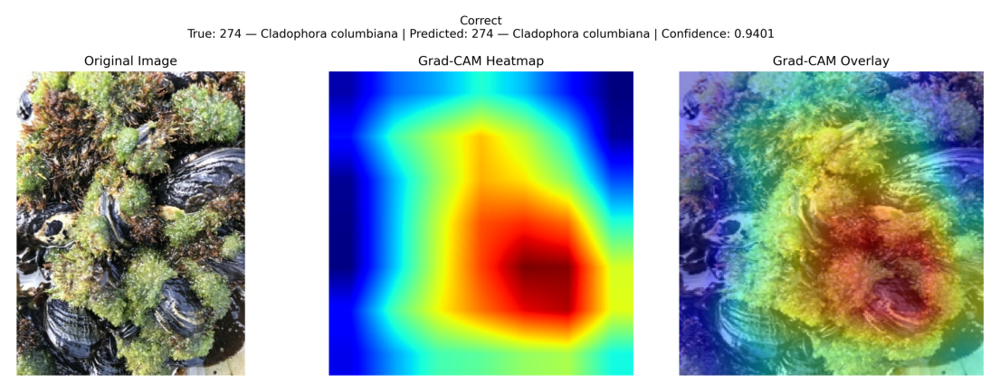

Correct Example 2: 02_true_418_pred_418.png


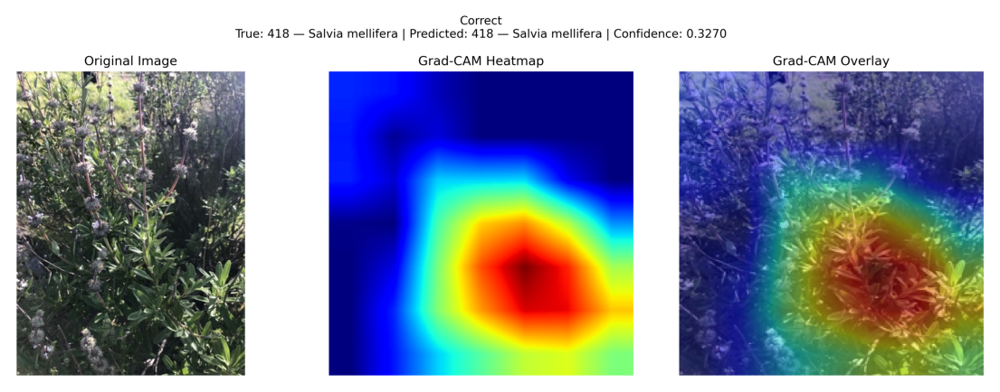

Correct Example 3: 03_true_139_pred_139.png


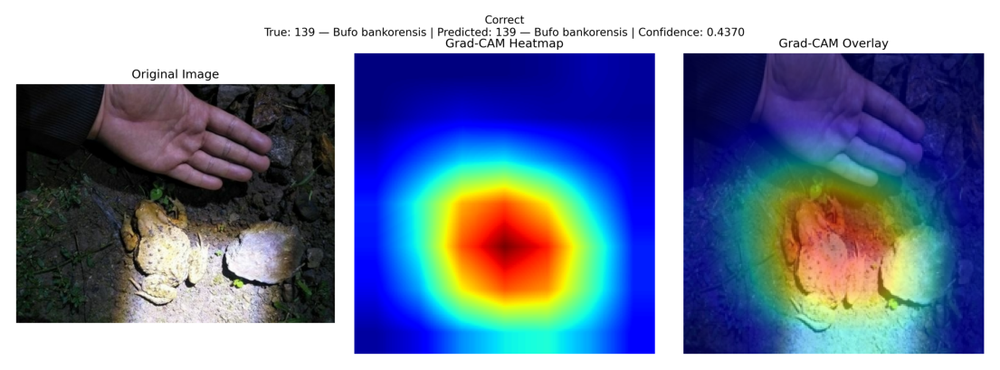

Correct Example 4: 04_true_293_pred_293.png


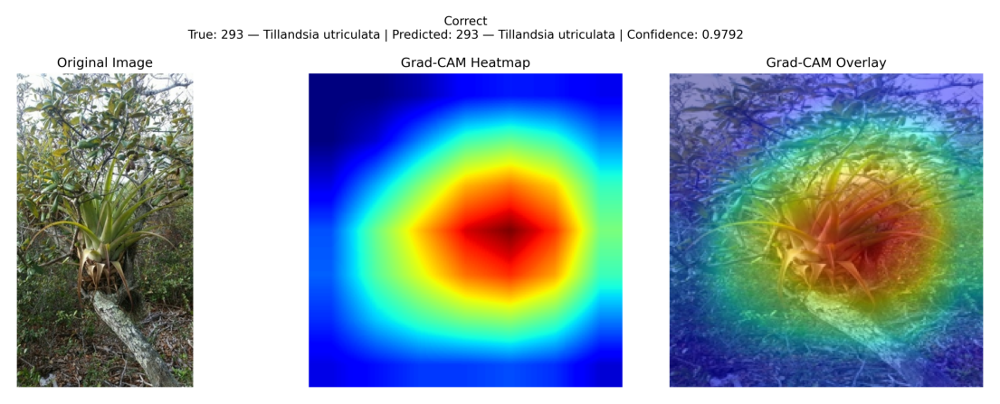

Correct Example 5: 05_true_123_pred_123.png


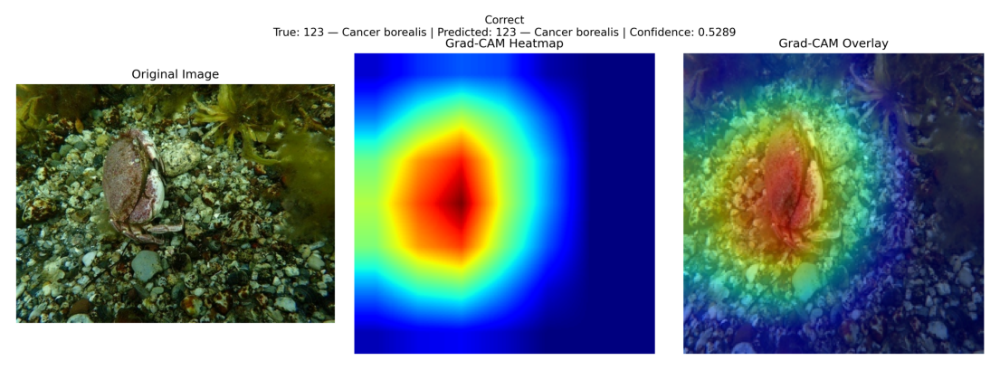

In [16]:
correct_gradcam_dir = (
    GRADCAM_FIGURE_DIR
    / "correct"
)

correct_gradcam_paths = sorted(
    correct_gradcam_dir.glob("*.png")
)

if len(correct_gradcam_paths) != 5:
    raise ValueError(
        "Expected 5 correct Grad-CAM figures, "
        f"but found {len(correct_gradcam_paths)}."
    )

for figure_index, image_path in enumerate(
    correct_gradcam_paths,
    start=1,
):
    print(
        f"Correct Example {figure_index}: "
        f"{image_path.name}"
    )

    gradcam_image = Image.open(image_path)

    plt.figure(figsize=(14, 6))
    plt.imshow(gradcam_image)
    plt.axis("off")
    plt.show()

### 2.5 Incorrectly Classified Examples

This section displays Grad-CAM visualisations for five incorrectly classified test images.

Incorrect Example 1: 01_true_393_pred_191.png


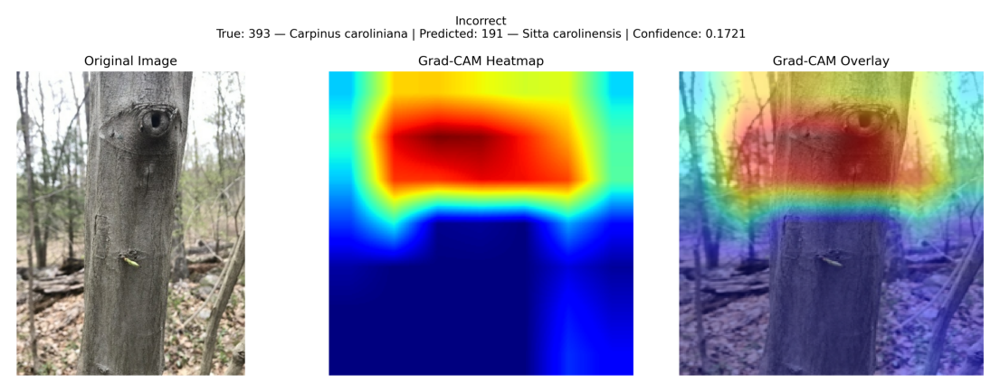

Incorrect Example 2: 02_true_146_pred_170.png


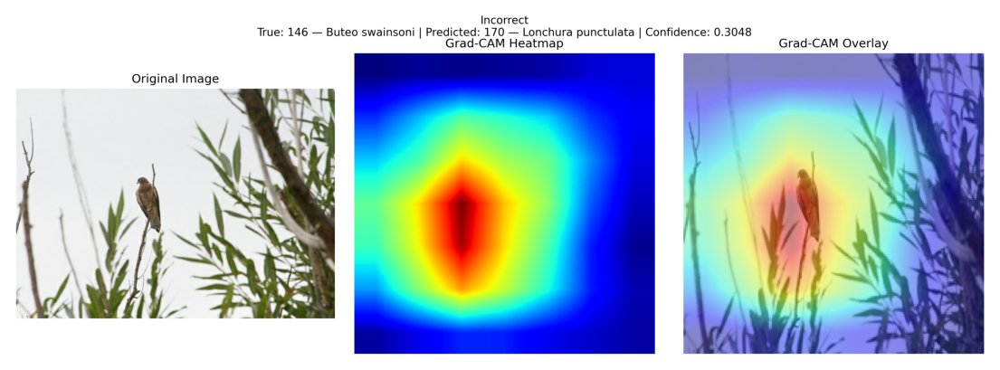

Incorrect Example 3: 03_true_346_pred_324.png


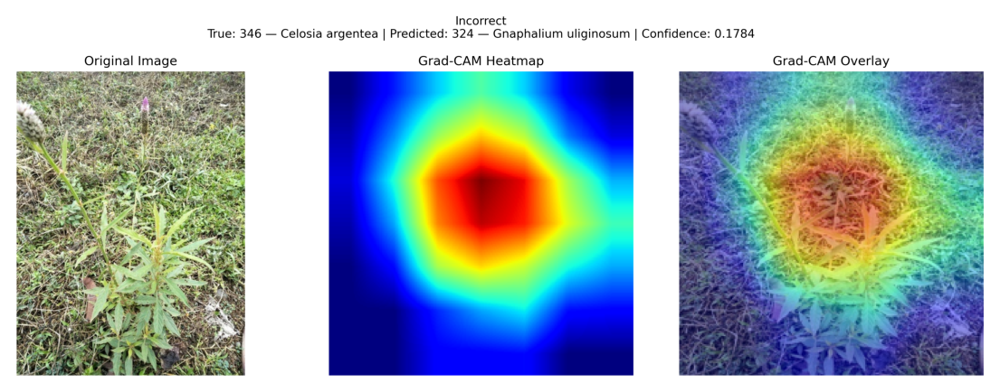

Incorrect Example 4: 04_true_195_pred_200.png


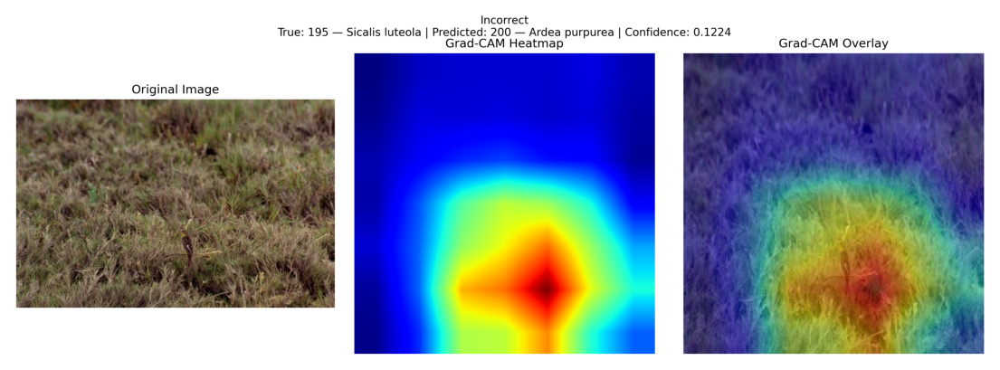

Incorrect Example 5: 05_true_172_pred_171.png


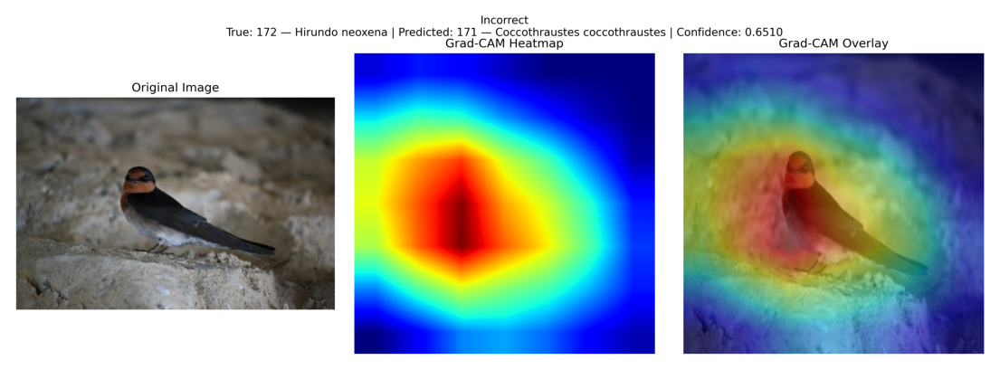

In [17]:
incorrect_gradcam_dir = (
    GRADCAM_FIGURE_DIR
    / "incorrect"
)

incorrect_gradcam_paths = sorted(
    incorrect_gradcam_dir.glob("*.png")
)

if len(incorrect_gradcam_paths) != 5:
    raise ValueError(
        "Expected 5 incorrect Grad-CAM figures, "
        f"but found {len(incorrect_gradcam_paths)}."
    )

for figure_index, image_path in enumerate(
    incorrect_gradcam_paths,
    start=1,
):
    print(
        f"Incorrect Example {figure_index}: "
        f"{image_path.name}"
    )

    gradcam_image = Image.open(image_path)

    plt.figure(figsize=(14, 6))
    plt.imshow(gradcam_image)
    plt.axis("off")
    plt.show()

### 2.6 Confusable Species Pair Examples

This section compares Grad-CAM visualisations for three frequently confused species pairs, including one misclassified image and one correctly classified reference image for each pair.

Confused Pair 1: 01_true_203_confused_with_202.png


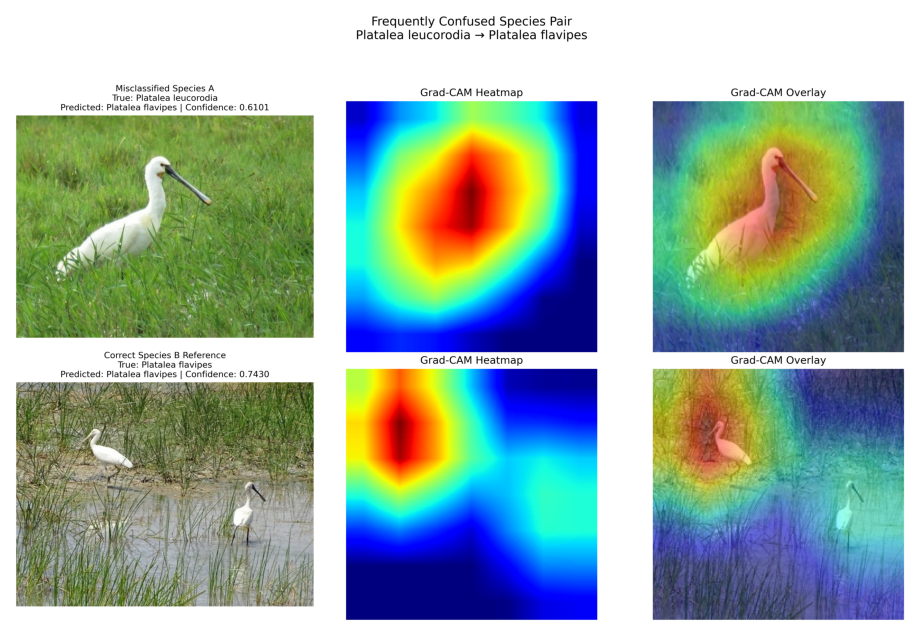

Confused Pair 2: 02_true_242_confused_with_243.png


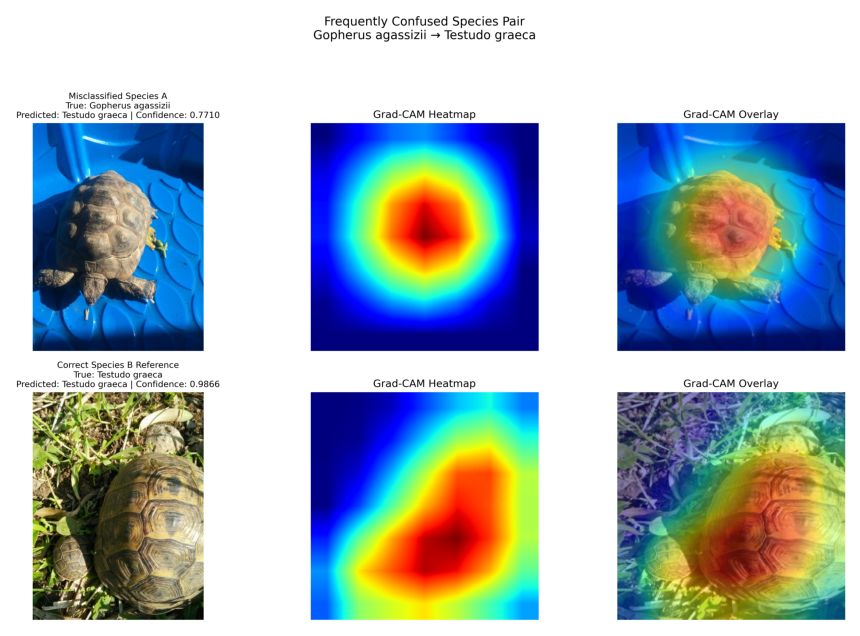

Confused Pair 3: 03_true_372_confused_with_370.png


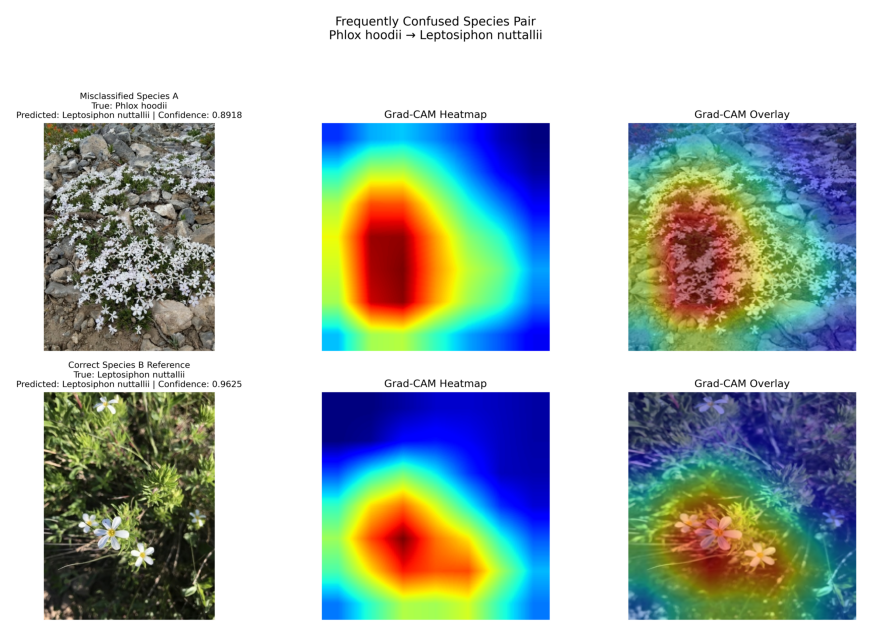

In [18]:
confused_pair_gradcam_dir = (
    GRADCAM_FIGURE_DIR
    / "confused_pair"
)

confused_pair_gradcam_paths = sorted(
    confused_pair_gradcam_dir.glob("*.png")
)

if len(confused_pair_gradcam_paths) != 3:
    raise ValueError(
        "Expected 3 confused-pair Grad-CAM figures, "
        f"but found {len(confused_pair_gradcam_paths)}."
    )

for pair_index, image_path in enumerate(
    confused_pair_gradcam_paths,
    start=1,
):
    print(
        f"Confused Pair {pair_index}: "
        f"{image_path.name}"
    )

    gradcam_image = Image.open(image_path)

    plt.figure(figsize=(15, 8))
    plt.imshow(gradcam_image)
    plt.axis("off")
    plt.show()

## 3. Final Model Comparison

This section compares the traditional model, scratch ResNet18 and pretrained ResNet18 using clean performance, robustness, training time and inference time.

### 3.1 Environment and Configuration

This cell defines the output paths used by the final model comparison pipeline.

In [19]:
FINAL_COMPARISON_TABLE_PATH = (
    PROJECT_ROOT
    / "results"
    / "final_comparison_table.csv"
)

FINAL_COMPARISON_FIGURE_PATH = (
    PROJECT_ROOT
    / "results"
    / "figures"
    / "final_comparison_table.png"
)

FINAL_COMPARISON_SCRIPT_PATH = (
    PROJECT_ROOT
    / "src"
    / "build_final_comparison_table.py"
)

print(
    f"Comparison script exists: "
    f"{FINAL_COMPARISON_SCRIPT_PATH.exists()}"
)

print(
    f"Comparison table path: "
    f"{FINAL_COMPARISON_TABLE_PATH}"
)

print(
    f"Comparison figure path: "
    f"{FINAL_COMPARISON_FIGURE_PATH}"
)

Comparison script exists: True
Comparison table path: /Users/yangjingwei/9517_Project/COMP9517-project/results/final_comparison_table.csv
Comparison figure path: /Users/yangjingwei/9517_Project/COMP9517-project/results/figures/final_comparison_table.png


### 3.2 Run the Final Comparison Pipeline

This cell runs the final comparison script and generates the combined CSV table and presentation-ready figure.

In [23]:
comparison_run = subprocess.run(
    [
        sys.executable,
        str(FINAL_COMPARISON_SCRIPT_PATH),
    ],
    cwd=PROJECT_ROOT,
    check=True,
    capture_output=True,
    text=True,
)

print("Final comparison pipeline completed successfully.")
print(f"CSV saved to: {FINAL_COMPARISON_TABLE_PATH}")
print(f"Figure saved to: {FINAL_COMPARISON_FIGURE_PATH}")

final_comparison_table = pd.read_csv(
    FINAL_COMPARISON_TABLE_PATH
)

display(
    final_comparison_table.style
    .hide(axis="index")
    .format(
        {
            "Clean Top-1": "{:.2%}",
            "Clean Top-5": "{:.2%}",
            "Clean Macro-F1": "{:.2%}",
            "Mean Degraded Top-1": "{:.2%}",
            "Mean Degraded Macro-F1": "{:.2%}",
            "Top-1 Retention": "{:.2%}",
            "Training Time (h)": "{:.2f}",
            "Clean Testing Time (s)": "{:.2f}",
        }
    )
)

Final comparison pipeline completed successfully.
CSV saved to: /Users/yangjingwei/9517_Project/COMP9517-project/results/final_comparison_table.csv
Figure saved to: /Users/yangjingwei/9517_Project/COMP9517-project/results/figures/final_comparison_table.png


Model,Clean Top-1,Clean Top-5,Clean Macro-F1,Mean Degraded Top-1,Mean Degraded Macro-F1,Top-1 Retention,Training Time (h),Clean Testing Time (s)
Traditional,10.74%,23.04%,9.82%,6.97%,6.32%,64.89%,0.73,265.83
Scratch ResNet18,32.10%,57.66%,29.73%,26.82%,25.07%,83.56%,2.81,9.95
Pretrained ResNet18,68.24%,86.98%,67.95%,57.21%,57.10%,83.83%,7.84,18.51


### 3.3 Presentation-Ready Comparison Figure

This section displays the final model comparison table in a presentation-ready format.

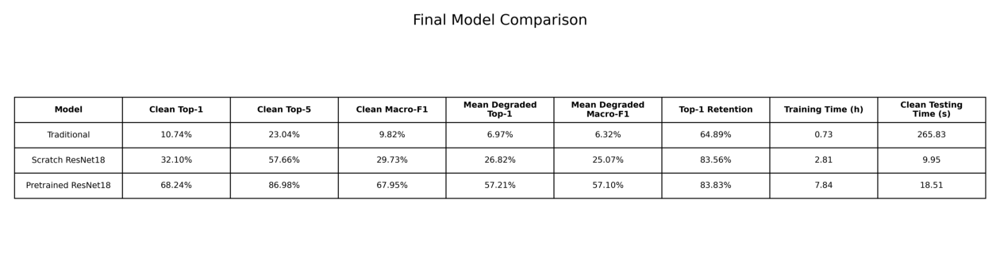

In [24]:
if not FINAL_COMPARISON_FIGURE_PATH.exists():
    raise FileNotFoundError(
        f"Final comparison figure not found: {FINAL_COMPARISON_FIGURE_PATH}"
    )

comparison_figure = Image.open(
    FINAL_COMPARISON_FIGURE_PATH
)

plt.figure(figsize=(16, 5))
plt.imshow(comparison_figure)
plt.axis("off")
plt.show()

### 3.4 Final Model Selection and Discussion

This section summarises the main comparison findings and identifies the most suitable model for the final system.

The pretrained ResNet18 achieved the strongest overall performance. It obtained the highest clean Top-1 accuracy of 68.24%, the highest clean Top-5 accuracy of 86.98%, and the highest clean Macro-F1 score of 67.95%. Under degraded conditions, it also maintained the best mean Top-1 accuracy and Macro-F1 score.

The scratch ResNet18 was less accurate than the pretrained model, but it retained a similar proportion of its clean performance under degradation. Its Top-1 retention was 83.56%, compared with 83.83% for the pretrained model. It also had the shortest clean testing time among the three models.

The traditional model had the lowest classification performance and the lowest robustness retention. Although it required the least training time, its clean testing time was substantially longer than both ResNet18 models.

Overall, the pretrained ResNet18 is selected as the final model because it provides the best balance of classification accuracy, robustness and practical inference efficiency. The Grad-CAM results also provide additional evidence that its predictions are often based on visually relevant image regions, although some errors remain when species have similar appearances or when the model focuses on background features.